# Sim Result: Artificial Clock with different clock rate on RL Controller, Further analysis on $\Delta T$

[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_clock_rate_100_clockfactor_0.2_recordtime_400.0_2021-11-22-00-48-14 already exists. Not creating.
[INFO]  Data folder /home/refulgent/Cyverse/sparkle/sparkle_n_24_clock_rate_100_clockfactor_0.5_recordtime_400.0_2021-11-22-01-04-52 already exists. Not creating.


/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:88: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:143: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:164: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



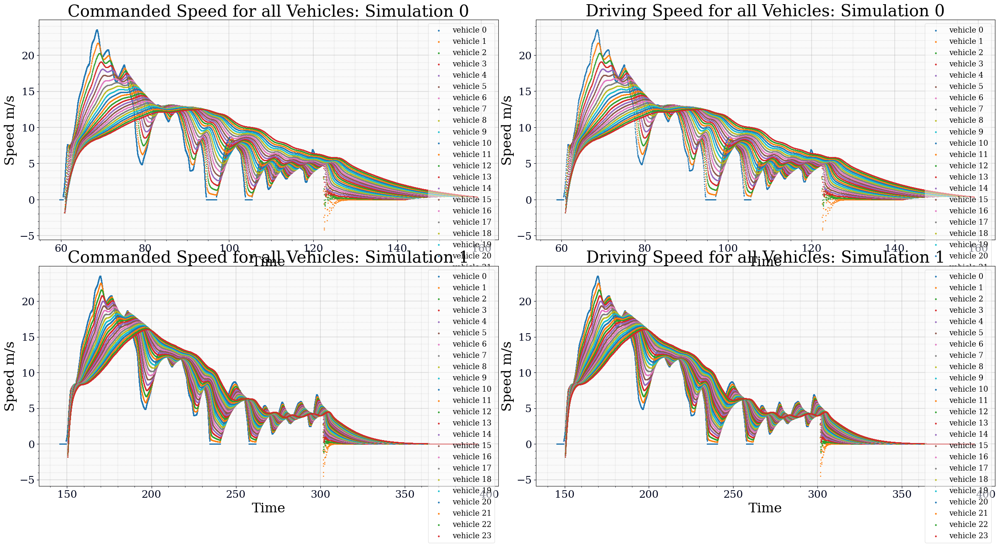

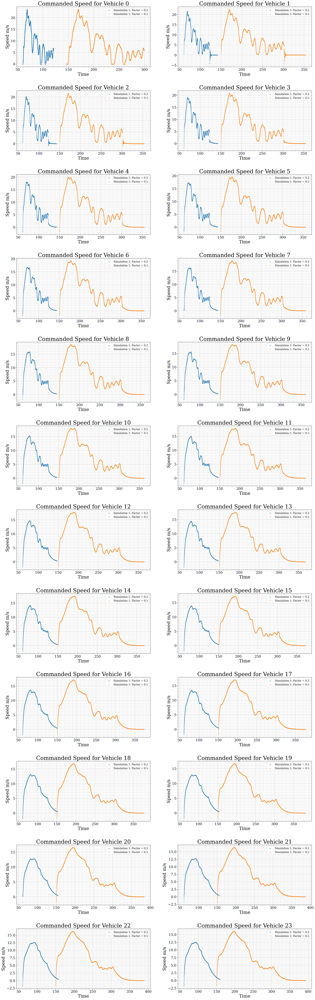

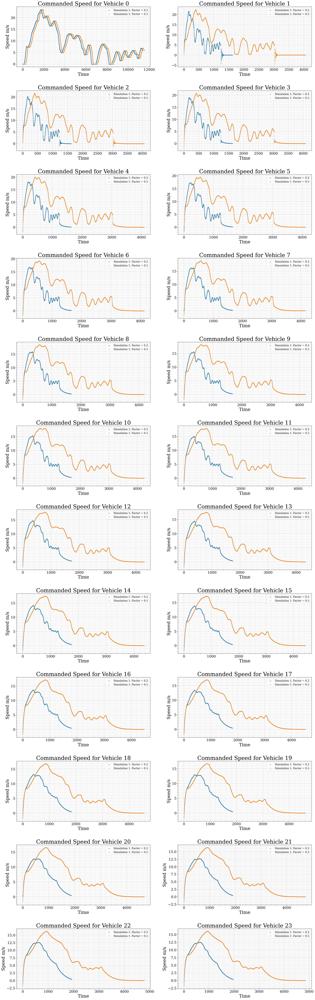

In [2]:
#!/usr/bin/env python

# Author: Rahul Bhadani

import sparkle
import time
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import bagpy
from bagpy import bagreader
from strym import strymread
import datetime
import time

dt_object = datetime.datetime.fromtimestamp(time.time())
dt = dt_object.strftime('%Y-%m-%d-%H-%M-%S-%f')

# Analysis
cmd_speed =[]
speed = []
posX = []
lead_dist = []
rel_vel = []

bagfiles = []


# no gui sparkle
bagfiles.append('/home/refulgent/Cyverse/sparkle/sparkle_n_24_clock_rate_100_clockfactor_0.2_recordtime_400.0_2021-11-22-00-48-14.bag')
bagfiles.append('/home/refulgent/Cyverse/sparkle/sparkle_n_24_clock_rate_100_clockfactor_0.5_recordtime_400.0_2021-11-22-01-04-52.bag')

n_cars = 24
Blist = []
for bf in bagfiles:
    B = bagreader(bf)
    Blist.append(B)
    cmd_speed_b = []
    speed_b = []
    odom_b = []
    lead_dist_b = []
    relvel_b = []
    for i in range(0, n_cars):
            # print(i)
            cmdvel_file = B.message_by_topic('/sparkle_{:03d}/cmd_vel'.format(i))
            cmdvel = pd.read_csv(cmdvel_file)
            cmd_speed_b.append(cmdvel)
            
            vel_file = B.message_by_topic('/sparkle_{:03d}/vel'.format(i))
            vel = pd.read_csv(vel_file)
            speed_b.append(vel)
            
            odom_file = B.message_by_topic('/sparkle_{:03d}/setvel'.format(i))
            odom = pd.read_csv(odom_file)
            odom_b.append(odom)
            
    cmd_speed.append(cmd_speed_b)
    speed.append(speed_b)
    posX.append(odom_b)
    lead_dist.append(lead_dist_b)
    rel_vel.append(relvel_b)


# per simuation plot
fig, ax = bagpy.create_fig(nrows = len(cmd_speed), ncols = 2 )
ax = ax.reshape(len(cmd_speed), 2 )
for j in range(0, len(cmd_speed)):
    
    cs = cmd_speed[j]
    s = speed[j]
    ld = lead_dist[j]
    rv = rel_vel[j]
    
    for i, v in enumerate(cs):
        ax[j, 0].scatter(x = 'Time', y = 'linear.x', data = cs[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 0].legend()
        ax[j, 0].set_xlabel('Time')
        ax[j, 0].set_ylabel('Speed m/s')
        ax[j, 0].set_title('Commanded Speed for all Vehicles: Simulation {}'.format(j))

    for i, v in enumerate(s):
        ax[j, 1].scatter(x = 'Time', y = 'linear.x', data = s[i], s = 1, label = 'vehicle {}'.format(i))
        ax[j, 1].legend()
        ax[j, 1].set_xlabel('Time')
        ax[j, 1].set_ylabel('Speed m/s')
        ax[j, 1].set_title('Driving Speed for all Vehicles: Simulation {}'.format(j))
        
fig.show()
#fig.savefig("persimulationplots_RTFhalf_vs_quarter_{}.png".format(dt), dpi = 100, bbox_inches='tight')

def scale_time(time_vector, scale = 2.0):
    """
    
    """
    if scale == 1.0:
        return time_vector
    diff = np.diff(time_vector)
    new_time = []
    new_time.append(time_vector[0])

    for i, d in enumerate(diff):
        t_next = new_time[i]  + d*scale
        new_time.append(t_next)

    return new_time

# overlaid plot
fig, ax = bagpy.create_fig(ncols = 2, nrows = int(np.ceil(n_cars/2)))

# p = [0]    
# for k in range(1, len(cmd_speed)):
#     p1 = strymread.time_shift(df1=cmd_speed[0][0], df2=cmd_speed[k][0], msg_col1 = 'linear.x', msg_col2='linear.x')
#     p.append(p1)

for j in range(0, len(cmd_speed[0])):
    
    # print('Vehicle: {}'.format(j))
    p = [0, 0.0]
    #scale = [1.0, 2.0]
    marker = ["o", "v", "s"]
    s= [2.0, 2.0, 2.0]
    # lb = [  'Simulation 1: RTF=0.5 MaxupdateRate = 50.0, time_step = 0.01', \
    #         'Simulation 1: RTF=0.25 MaxupdateRate = 25.0, time_step = 0.01',\
    #         'Simulation 1: RTF=0.25 MaxupdateRate = 50.0, time_step = 0.005']
    
    lb = [  'Simulation 1: Factor = 0.2', \
            'Simulation 1: Factor = 0.5']

    for k in range(0, len(cmd_speed)):

        time = cmd_speed[k][j]['Time'].tolist()
        #new_time = scale_time(time, scale[k])
        #cmd_speed[k][j]['Time'] = new_time
        #ax[j].scatter(x = cmd_speed[k][j]['Time'] - p[k] , y = cmd_speed[k][j]['linear.x']  ,  s = 2, label = 'simulation#_{}'.format(k))
        #ax[j].scatter(x= np.arange(0, cmd_speed[k][j].shape[0]) + p[k], y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k])
        ax[j].scatter(x= cmd_speed[k][j]['Time'] + p[k], y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k])
    

    ax[j].legend()
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.show()


fig, ax = bagpy.create_fig(ncols = 2, nrows = int(np.ceil(n_cars/2)))
for j in range(0, len(cmd_speed[0])):
    p = [0, 0.0]
    marker = ["o", "v", "s"]
    s= [2.0, 2.0, 2.0]    
    lb = [  'Simulation 1: Factor = 0.2', \
            'Simulation 1: Factor = 0.5']

    for k in range(0, len(cmd_speed)):

        time = cmd_speed[k][j]['Time'].tolist()
        ax[j].scatter(x= np.arange(0, cmd_speed[k][j].shape[0]) + p[k], y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k])
        

    ax[j].legend()
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.show()

In [3]:
Blist

In [4]:
B0 = Blist[0]

In [5]:
B0

In [6]:
B0.topic_table

,Topics,Types,Message Count,Frequency
0,/clock,rosgraph_msgs/Clock,13166,100.000000
1,/rosout,rosgraph_msgs/Log,131962,NaN
2,/rosout_agg,rosgraph_msgs/Log,131973,NaN
3,/sparkle_000/cmd_vel,geometry_msgs/Twist,11376,100.000000
4,/sparkle_000/setvel,nav_msgs/Odometry,2035,33.333333
...,...,...,...,...
71,/sparkle_022/vel,geometry_msgs/Twist,1931,20.000000
72,/sparkle_023/cmd_vel,geometry_msgs/Twist,1965,20.000000
73,/sparkle_023/setvel,nav_msgs/Odometry,1964,20.000000
74,/sparkle_023/vel,geometry_msgs/Twist,1964,20.000000


In [7]:
# Let's calculate the diff of `/clock`

In [9]:
clock_file = B0.message_by_topic('/clock')
clock_df = pd.read_csv(clock_file)
clock_df

,Time,clock.secs,clock.nsecs
0,28.66,28,360000000
1,28.66,28,370000000
2,28.66,28,380000000
3,28.66,28,390000000
4,28.66,28,400000000
...,...,...,...
13161,159.97,159,970000000
13162,159.98,159,980000000
13163,159.99,159,990000000
13164,160.00,160,0


In [10]:
clock_df['Total_Time'] = clock_df['clock.secs'] + clock_df['clock.secs']*1e-9
clock_df

,Time,clock.secs,clock.nsecs,Total_Time
0,28.66,28,360000000,28.0
1,28.66,28,370000000,28.0
2,28.66,28,380000000,28.0
3,28.66,28,390000000,28.0
4,28.66,28,400000000,28.0
...,...,...,...,...
13161,159.97,159,970000000,159.0
13162,159.98,159,980000000,159.0
13163,159.99,159,990000000,159.0
13164,160.00,160,0,160.0


In [11]:
clock_df['Total_Time'].iloc[0]

28.000000028

In [12]:
clock_df['Total_Time'] = clock_df['clock.secs']*1e9 + clock_df['clock.secs']
clock_df

,Time,clock.secs,clock.nsecs,Total_Time
0,28.66,28,360000000,2.800000e+10
1,28.66,28,370000000,2.800000e+10
2,28.66,28,380000000,2.800000e+10
3,28.66,28,390000000,2.800000e+10
4,28.66,28,400000000,2.800000e+10
...,...,...,...,...
13161,159.97,159,970000000,1.590000e+11
13162,159.98,159,980000000,1.590000e+11
13163,159.99,159,990000000,1.590000e+11
13164,160.00,160,0,1.600000e+11


In [22]:
print("{0:7.10f}".format(2))

2.0000000000


In [23]:
print("{0:7.18f}".format(2))

2.000000000000000000


In [24]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[0]))

28000000028.000000000000000000


In [25]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[1]))

28000000028.000000000000000000


In [26]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[2]))

28000000028.000000000000000000


In [27]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[3]))

28000000028.000000000000000000


In [28]:
clock_df['Total_Time'] = clock_df['clock.secs']*1e9 + clock_df['clock.secs']
clock_df

,Time,clock.secs,clock.nsecs,Total_Time
0,28.66,28,360000000,2.800000e+10
1,28.66,28,370000000,2.800000e+10
2,28.66,28,380000000,2.800000e+10
3,28.66,28,390000000,2.800000e+10
4,28.66,28,400000000,2.800000e+10
...,...,...,...,...
13161,159.97,159,970000000,1.590000e+11
13162,159.98,159,980000000,1.590000e+11
13163,159.99,159,990000000,1.590000e+11
13164,160.00,160,0,1.600000e+11


In [29]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[3]))

28000000028.000000000000000000


In [30]:
clock_df['Total_Time'] = clock_df['clock.secs']*1e9 + clock_df['clock.nsecs']
clock_df

,Time,clock.secs,clock.nsecs,Total_Time
0,28.66,28,360000000,2.836000e+10
1,28.66,28,370000000,2.837000e+10
2,28.66,28,380000000,2.838000e+10
3,28.66,28,390000000,2.839000e+10
4,28.66,28,400000000,2.840000e+10
...,...,...,...,...
13161,159.97,159,970000000,1.599700e+11
13162,159.98,159,980000000,1.599800e+11
13163,159.99,159,990000000,1.599900e+11
13164,160.00,160,0,1.600000e+11


In [31]:
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[3]))

28390000000.000000000000000000


In [32]:
clock_df['Total_Time'] = clock_df['clock.secs'] + clock_df['clock.nsecs']*1e-9
print("{0:7.18f}".format(clock_df['Total_Time'].iloc[0]))

28.359999999999999432


In [33]:
clock_df['Total_Time'] = clock_df['clock.secs'] + clock_df['clock.nsecs']*1e-9
clock_df['Tdiff'] =clock_df['Total_Time'].diff()
clock_df

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,28.66,28,360000000,28.36,NaN
1,28.66,28,370000000,28.37,0.01
2,28.66,28,380000000,28.38,0.01
3,28.66,28,390000000,28.39,0.01
4,28.66,28,400000000,28.40,0.01
...,...,...,...,...,...
13161,159.97,159,970000000,159.97,0.01
13162,159.98,159,980000000,159.98,0.01
13163,159.99,159,990000000,159.99,0.01
13164,160.00,160,0,160.00,0.01


In [34]:
clock_df

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,28.66,28,360000000,28.36,NaN
1,28.66,28,370000000,28.37,0.01
2,28.66,28,380000000,28.38,0.01
3,28.66,28,390000000,28.39,0.01
4,28.66,28,400000000,28.40,0.01
...,...,...,...,...,...
13161,159.97,159,970000000,159.97,0.01
13162,159.98,159,980000000,159.98,0.01
13163,159.99,159,990000000,159.99,0.01
13164,160.00,160,0,160.00,0.01


In [35]:
print("{0:7.18f}".format(clock_df['Tdiff'].iloc[0]))

    nan


In [36]:
print("{0:7.18f}".format(clock_df['Tdiff'].iloc[1]))

0.010000000000001563


In [38]:
B0 = Blist[0]
clock_file = B0.message_by_topic('/clock')
clock_df1 = pd.read_csv(clock_file)
clock_df1['Total_Time'] = clock_df1['clock.secs'] + clock_df1['clock.nsecs']*1e-9
clock_df1['Tdiff'] =clock_df1['Total_Time'].diff()

B1 = Blist[1]
clock_file = B1.message_by_topic('/clock')
clock_df2 = pd.read_csv(clock_file)
clock_df2['Total_Time'] = clock_df2['clock.secs'] + clock_df2['clock.nsecs']*1e-9
clock_df2['Tdiff'] =clock_df2['Total_Time'].diff()

In [39]:
clock_df1

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,28.66,28,360000000,28.36,NaN
1,28.66,28,370000000,28.37,0.01
2,28.66,28,380000000,28.38,0.01
3,28.66,28,390000000,28.39,0.01
4,28.66,28,400000000,28.40,0.01
...,...,...,...,...,...
13161,159.97,159,970000000,159.97,0.01
13162,159.98,159,980000000,159.98,0.01
13163,159.99,159,990000000,159.99,0.01
13164,160.00,160,0,160.00,0.01


In [40]:
clock_df2

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,71.58,70,770000000,70.77,NaN
1,71.58,70,780000000,70.78,0.01
2,71.58,70,790000000,70.79,0.01
3,71.58,70,800000000,70.80,0.01
4,71.58,70,810000000,70.81,0.01
...,...,...,...,...,...
32444,395.21,395,210000000,395.21,0.01
32445,395.22,395,220000000,395.22,0.01
32446,395.23,395,230000000,395.23,0.01
32447,395.24,395,240000000,395.24,0.01


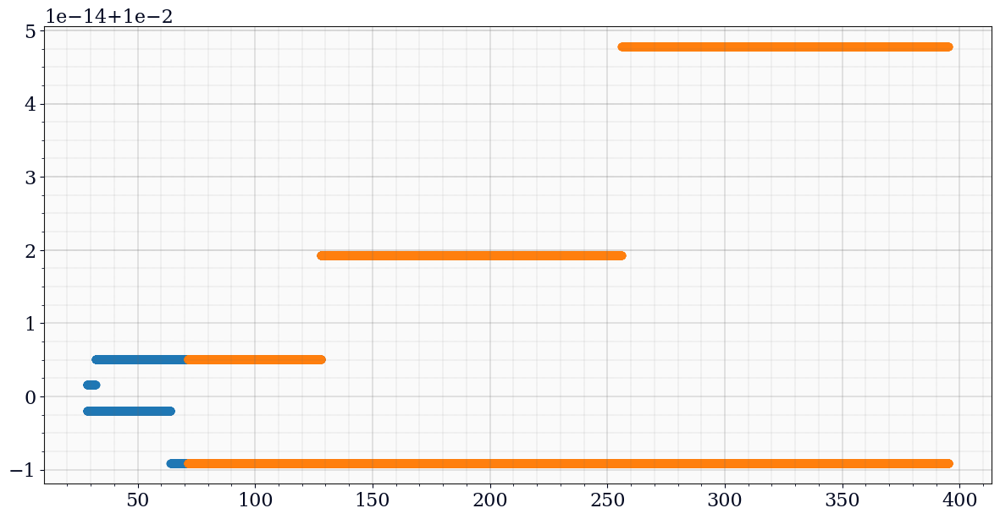

In [41]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x = 'Time', y = 'Tdiff', data = clock_df1)

ax[0].scatter(x = 'Time', y = 'Tdiff', data = clock_df2)

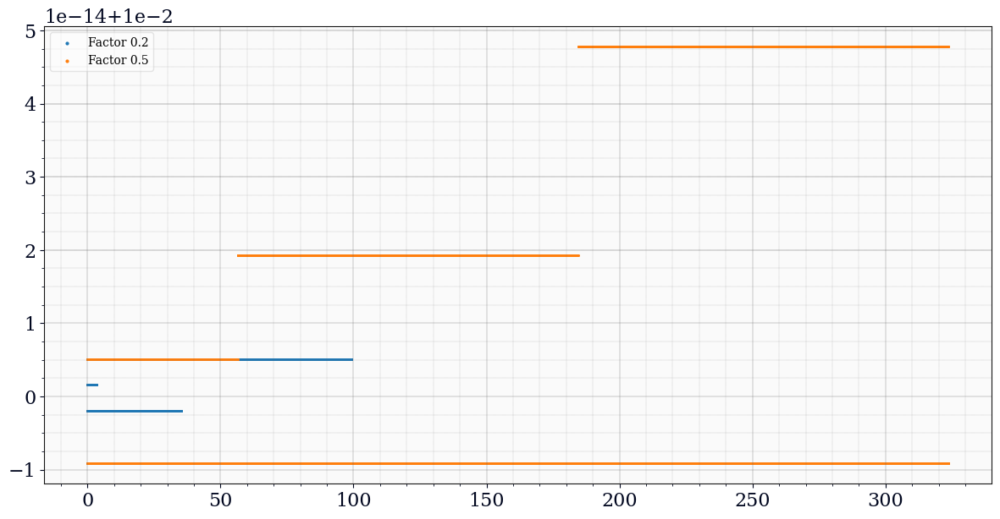

In [43]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x = clock_df1['Time'] - clock_df1['Time'].iloc[0], y = clock_df1['Tdiff'], label='Factor 0.2', s= 1)

ax[0].scatter(x = clock_df2['Time'] - clock_df2['Time'].iloc[0], y = clock_df2['Tdiff'], label='Factor 0.5', s= 1)
ax[0].legend()

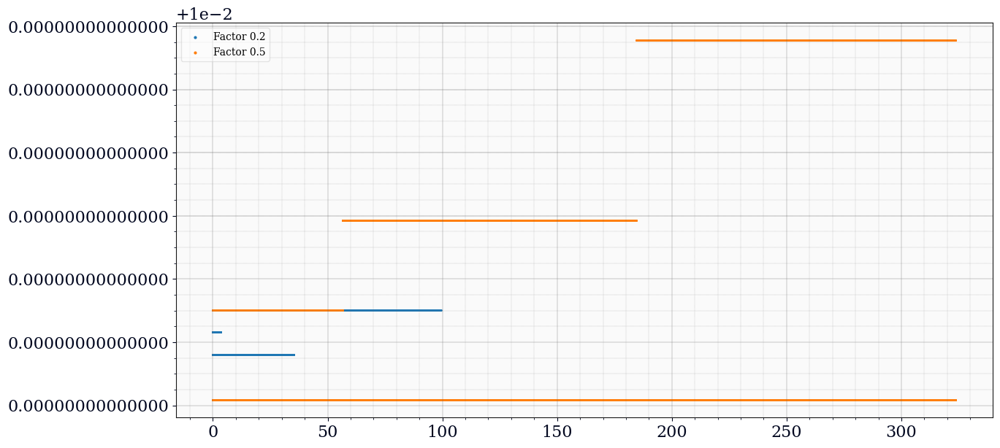

In [44]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x = clock_df1['Time'] - clock_df1['Time'].iloc[0], y = clock_df1['Tdiff'], label='Factor 0.2', s= 1)

ax[0].scatter(x = clock_df2['Time'] - clock_df2['Time'].iloc[0], y = clock_df2['Tdiff'], label='Factor 0.5', s= 1)
plt.ticklabel_format(style='plain') 
ax[0].legend()

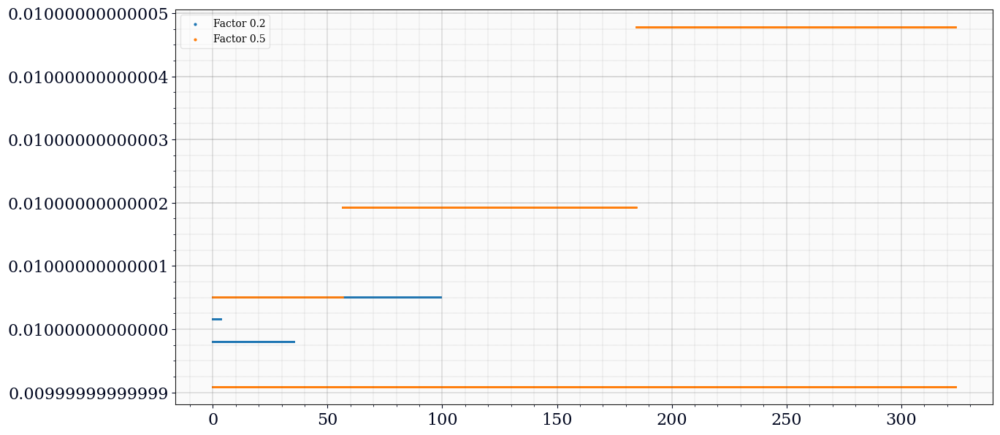

In [46]:
fig, ax = bagpy.create_fig(1)
ax[0].scatter(x = clock_df1['Time'] - clock_df1['Time'].iloc[0], y = clock_df1['Tdiff'], label='Factor 0.2', s= 1)

ax[0].scatter(x = clock_df2['Time'] - clock_df2['Time'].iloc[0], y = clock_df2['Tdiff'], label='Factor 0.5', s= 1)
ax[0].ticklabel_format(useOffset=False) 
ax[0].legend()

In [47]:
cmd_speed

[[         Time  linear.x  linear.y  linear.z  angular.x  angular.y  angular.z
  0       59.72      0.00       0.0       0.0        0.0        0.0        0.0
  1       59.72      0.00       0.0       0.0        0.0        0.0        0.0
  2       59.73      0.00       0.0       0.0        0.0        0.0        0.0
  3       59.74      0.00       0.0       0.0        0.0        0.0        0.0
  4       59.74      0.00       0.0       0.0        0.0        0.0        0.0
  ...       ...       ...       ...       ...        ...        ...        ...
  11371  120.54      5.87       0.0       0.0        0.0        0.0        0.0
  11372  120.55      5.85       0.0       0.0        0.0        0.0        0.0
  11373  120.56      5.85       0.0       0.0        0.0        0.0        0.0
  11374  120.57      5.84       0.0       0.0        0.0        0.0        0.0
  11375  120.57      5.84       0.0       0.0        0.0        0.0        0.0
  
  [11376 rows x 7 columns],
          Time      l

In [49]:
len(cmd_speed)

2

In [50]:
len(cmd_speed[0])

24

In [51]:
cmd1sim1 = cmd_speed[0][0]

In [52]:
cmd1sim2 = cmd_speed[1][0]

In [53]:
cmd1sim1

,Time,linear.x,linear.y,linear.z,angular.x,angular.y,angular.z
0,59.72,0.00,0.0,0.0,0.0,0.0,0.0
1,59.72,0.00,0.0,0.0,0.0,0.0,0.0
2,59.73,0.00,0.0,0.0,0.0,0.0,0.0
3,59.74,0.00,0.0,0.0,0.0,0.0,0.0
4,59.74,0.00,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
11371,120.54,5.87,0.0,0.0,0.0,0.0,0.0
11372,120.55,5.85,0.0,0.0,0.0,0.0,0.0
11373,120.56,5.85,0.0,0.0,0.0,0.0,0.0
11374,120.57,5.84,0.0,0.0,0.0,0.0,0.0


/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:19: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



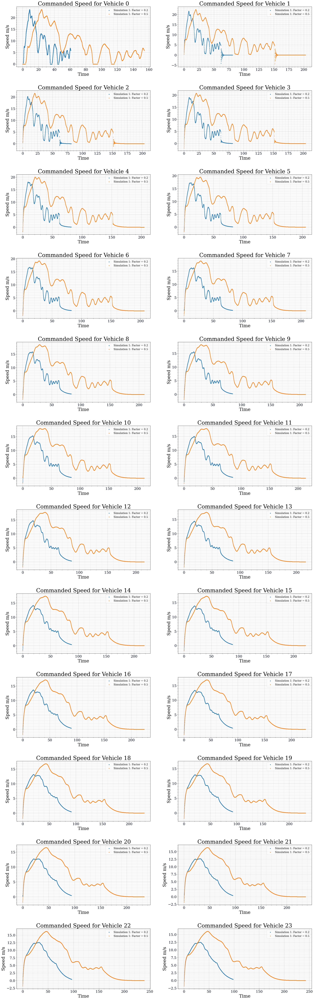

In [54]:
fig, ax = bagpy.create_fig(ncols = 2, nrows = int(np.ceil(n_cars/2)))
for j in range(0, len(cmd_speed[0])):
    p = [0, 0.0]
    marker = ["o", "v", "s"]
    s= [2.0, 2.0, 2.0]
    lb = [  'Simulation 1: Factor = 0.2', \
            'Simulation 1: Factor = 0.5']

    for k in range(0, len(cmd_speed)):

        time = cmd_speed[k][j]['Time'].tolist()
        ax[j].scatter(x= cmd_speed[k][j]['Time'] + p[k] - cmd_speed[k][j]['Time'].iloc[0], y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k])
    

    ax[j].legend()
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.show()

In [55]:
cmd_speed[1][22]['Time']

0       150.33
1       150.38
2       150.43
3       150.48
4       150.53
         ...  
4778    389.23
4779    389.28
4780    389.33
4781    389.38
4782    389.43
Name: Time, Length: 4783, dtype: float64

In [56]:
cmd_speed[1][0]['linear.x']

0        0.00
1        0.00
2        0.00
3        0.00
4        0.00
         ... 
11526    5.87
11527    5.85
11528    5.85
11529    5.84
11530    5.84
Name: linear.x, Length: 11531, dtype: float64

In [57]:
cmd_speed[1][0]['linear.x'].tolist()

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [58]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0]

,Time,linear.x,linear.y,linear.z,angular.x,angular.y,angular.z
300,149.42,0.39,0.0,0.0,0.0,0.0,0.0
301,149.43,0.42,0.0,0.0,0.0,0.0,0.0
302,149.44,0.43,0.0,0.0,0.0,0.0,0.0
303,149.45,0.45,0.0,0.0,0.0,0.0,0.0
304,149.46,0.47,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
11526,299.62,5.87,0.0,0.0,0.0,0.0,0.0
11527,299.65,5.85,0.0,0.0,0.0,0.0,0.0
11528,299.66,5.85,0.0,0.0,0.0,0.0,0.0
11529,299.68,5.84,0.0,0.0,0.0,0.0,0.0


In [59]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0].iloc[0]

Time         149.42
linear.x       0.39
linear.y       0.00
linear.z       0.00
angular.x      0.00
angular.y      0.00
angular.z      0.00
Name: 300, dtype: float64

In [60]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0].iloc[0]['Time']

149.42

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:16: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:16: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/home/refulgent/VersionControl/spa

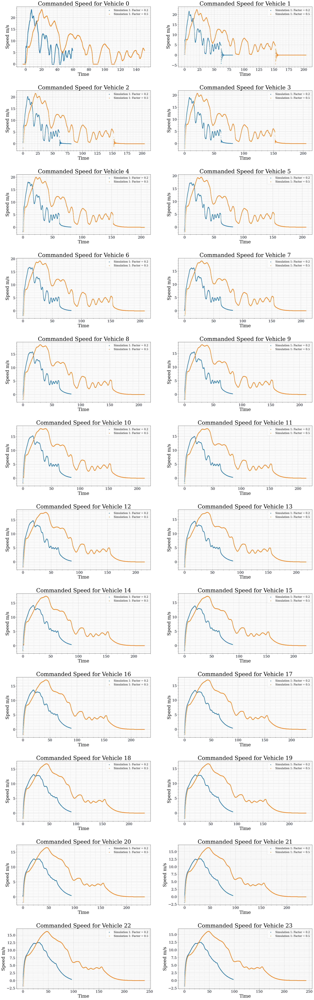

In [61]:
fig, ax = bagpy.create_fig(ncols = 2, nrows = int(np.ceil(n_cars/2)))
for j in range(0, len(cmd_speed[0])):
    p = [0, 0.0]
    marker = ["o", "v", "s"]
    s= [2.0, 2.0, 2.0]
    lb = [  'Simulation 1: Factor = 0.2', \
            'Simulation 1: Factor = 0.5']
    for k in range(0, len(cmd_speed)):
        time = cmd_speed[k][j]['Time'].tolist()
        t0 = cmd_speed[k][0][cmd_speed[1][0]['linear.x'] > 0].iloc[0]['Time']
        ax[j].scatter(x= cmd_speed[k][j]['Time'] + p[k] - t0, y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k])
    ax[j].legend()
    ax[j].set_xlabel('Time')
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.show()

In [62]:
cmd_speed[1][0]['Time'].diff()

0         NaN
1        0.01
2        0.01
3        0.01
4        0.02
         ... 
11526    0.02
11527    0.03
11528    0.01
11529    0.02
11530    0.00
Name: Time, Length: 11531, dtype: float64

In [63]:
cmd_speed[0][0]['Time'].diff()

0         NaN
1        0.00
2        0.01
3        0.01
4        0.00
         ... 
11371    0.00
11372    0.01
11373    0.01
11374    0.01
11375    0.00
Name: Time, Length: 11376, dtype: float64

In [64]:
cmd_speed[1][1]['Time'].diff()

0        NaN
1       0.05
2       0.05
3       0.05
4       0.05
        ... 
4054    0.05
4055    0.05
4056    0.05
4057    0.05
4058    0.05
Name: Time, Length: 4059, dtype: float64

In [65]:
cmd_speed[0][1]['Time'].diff()

0        NaN
1       0.05
2       0.05
3       0.05
4       0.05
        ... 
1619    0.05
1620    0.05
1621    0.05
1622    0.05
1623    0.05
Name: Time, Length: 1624, dtype: float64

In [66]:
cmd_speed[0][1]['Time']

0        60.83
1        60.88
2        60.93
3        60.98
4        61.03
         ...  
1619    141.78
1620    141.83
1621    141.88
1622    141.93
1623    141.98
Name: Time, Length: 1624, dtype: float64

In [67]:
cmd_speed[1][1]['Time']

0       150.32
1       150.37
2       150.42
3       150.47
4       150.52
         ...  
4054    353.02
4055    353.07
4056    353.12
4057    353.17
4058    353.22
Name: Time, Length: 4059, dtype: float64

In [68]:
cmd_speed[0][1]['Time'].diff()

0        NaN
1       0.05
2       0.05
3       0.05
4       0.05
        ... 
1619    0.05
1620    0.05
1621    0.05
1622    0.05
1623    0.05
Name: Time, Length: 1624, dtype: float64

In [69]:
cmd_speed[1][1]['Time'].diff()

0        NaN
1       0.05
2       0.05
3       0.05
4       0.05
        ... 
4054    0.05
4055    0.05
4056    0.05
4057    0.05
4058    0.05
Name: Time, Length: 4059, dtype: float64

In [70]:
clock_df1

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,28.66,28,360000000,28.36,NaN
1,28.66,28,370000000,28.37,0.01
2,28.66,28,380000000,28.38,0.01
3,28.66,28,390000000,28.39,0.01
4,28.66,28,400000000,28.40,0.01
...,...,...,...,...,...
13161,159.97,159,970000000,159.97,0.01
13162,159.98,159,980000000,159.98,0.01
13163,159.99,159,990000000,159.99,0.01
13164,160.00,160,0,160.00,0.01


In [71]:
clock_df2

,Time,clock.secs,clock.nsecs,Total_Time,Tdiff
0,71.58,70,770000000,70.77,NaN
1,71.58,70,780000000,70.78,0.01
2,71.58,70,790000000,70.79,0.01
3,71.58,70,800000000,70.80,0.01
4,71.58,70,810000000,70.81,0.01
...,...,...,...,...,...
32444,395.21,395,210000000,395.21,0.01
32445,395.22,395,220000000,395.22,0.01
32446,395.23,395,230000000,395.23,0.01
32447,395.24,395,240000000,395.24,0.01


In [72]:
clock_df1['Time'].diff()

0         NaN
1        0.00
2        0.00
3        0.00
4        0.00
         ... 
13161    0.01
13162    0.01
13163    0.01
13164    0.01
13165    0.01
Name: Time, Length: 13166, dtype: float64

In [73]:
clock_df2['Time'].diff()

0         NaN
1        0.00
2        0.00
3        0.00
4        0.00
         ... 
32444    0.01
32445    0.01
32446    0.01
32447    0.01
32448    0.01
Name: Time, Length: 32449, dtype: float64

In [74]:
clock_df2['Time'].diff()[0].iloc[0]

AttributeError: 'numpy.float64' object has no attribute 'iloc'

In [75]:
clock_df2['Time'].diff().iloc[0]

nan

In [76]:
clock_df2['Time'].diff().iloc[1]

0.0

In [77]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[0])) 

    nan


In [78]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[1])) 

0.000000000000000000


In [79]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[2])) 

0.000000000000000000


In [80]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[20])) 

0.000000000000000000


In [81]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[200])) 

0.009999999999990905


In [82]:
print("{0:7.18f}".format(clock_df2['Time'].diff().iloc[2000])) 

0.009999999999990905


In [83]:
print("{0:7.18f}".format(clock_df1['Time'].diff().iloc[2000])) 

0.009999999999998010


In [84]:
print("{0:7.18f}".format(clock_df1['Total_Time'].diff().iloc[2000])) 

0.009999999999998010


In [85]:
print("{0:7.18f}".format(clock_df2['Total_Time'].diff().iloc[2000])) 

0.009999999999990905


In [86]:
cmd_speed[0][0]['Time'].shape

(11376,)

In [87]:
cmd_speed[1][0]['Time'].shape

(11531,)

In [88]:
cmd_speed[0][1]['Time'].shape

(1624,)

In [89]:
cmd_speed[0][2]['Time'].shape

(1627,)

In [90]:
cmd_speed[1][1]['Time'].shape

(4059,)

In [91]:
cmd_speed[0][1]['Time'] - cmd_speed[0][1]['Time'].iloc[0]

0        0.00
1        0.05
2        0.10
3        0.15
4        0.20
        ...  
1619    80.95
1620    81.00
1621    81.05
1622    81.10
1623    81.15
Name: Time, Length: 1624, dtype: float64

In [92]:
cmd_speed[1][1]['Time'] - cmd_speed[1][1]['Time'].iloc[0]

0         0.00
1         0.05
2         0.10
3         0.15
4         0.20
         ...  
4054    202.70
4055    202.75
4056    202.80
4057    202.85
4058    202.90
Name: Time, Length: 4059, dtype: float64

In [112]:
t0 = cmd_speed[0][0][cmd_speed[0][0]['linear.x'] > 0].iloc[0]['Time']

In [113]:
t0

60.46

In [115]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0].iloc[0]['Time']

149.42

In [118]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0].iloc[0]['Time']

149.42

In [119]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0].iloc[-1]['Time']

299.68

In [120]:
cmd_speed[1][0]['linear.x'] > 0]

SyntaxError: invalid syntax (<ipython-input-120-b3599b125b63>, line 1)

In [121]:
cmd_speed[1][0]['linear.x'] > 0

0        False
1        False
2        False
3        False
4        False
         ...  
11526     True
11527     True
11528     True
11529     True
11530     True
Name: linear.x, Length: 11531, dtype: bool

In [122]:
cmd_speed[1][0][cmd_speed[1][0]['linear.x'] > 0]

,Time,linear.x,linear.y,linear.z,angular.x,angular.y,angular.z
300,149.42,0.39,0.0,0.0,0.0,0.0,0.0
301,149.43,0.42,0.0,0.0,0.0,0.0,0.0
302,149.44,0.43,0.0,0.0,0.0,0.0,0.0
303,149.45,0.45,0.0,0.0,0.0,0.0,0.0
304,149.46,0.47,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...
11526,299.62,5.87,0.0,0.0,0.0,0.0,0.0
11527,299.65,5.85,0.0,0.0,0.0,0.0,0.0
11528,299.66,5.85,0.0,0.0,0.0,0.0,0.0
11529,299.68,5.84,0.0,0.0,0.0,0.0,0.0


/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:23: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:23: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:23: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle-NoGUI.py:23: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

/home/refulgent/VersionControl/sparkle_python/notebooks/RTF_Analysis_Sparkle

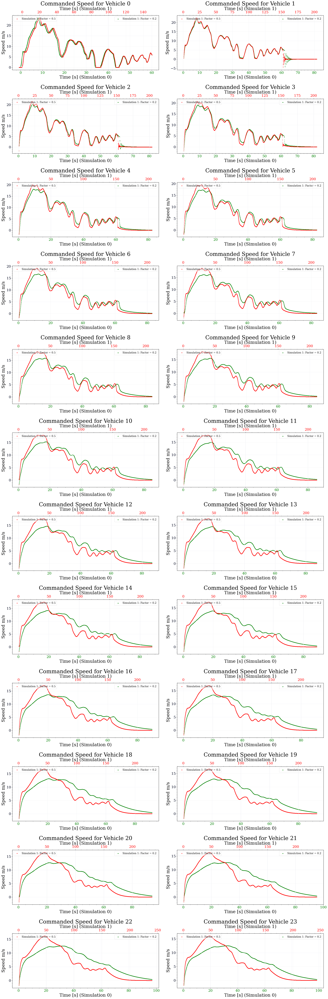

In [128]:
fig, ax = plt.subplots(int(np.ceil(n_cars/2)), 2)
ax = ax.ravel()
for j in range(0, len(cmd_speed[0])):
    marker = ["o", "v", "s"]
    s= [2.0, 2.0, 2.0]
    lb = [  'Simulation 1: Factor = 0.2', \
            'Simulation 1: Factor = 0.5']
    ax2 = ax[j].twiny()
    axx = [ax[j], ax2]
    color =['green', 'red']
    legend_loc = ['upper right', 'upper left']
    for k in range(0, len(cmd_speed)):
        time = cmd_speed[k][j]['Time'].tolist()
        t0 = cmd_speed[k][0][cmd_speed[k][0]['linear.x'] > 0].iloc[0]['Time']
        axx[k].scatter(x= cmd_speed[k][j]['Time'] - t0, y = cmd_speed[k][j]['linear.x']  ,  s = s[k], label = lb[k], marker =marker[k], c=color[k])
        axx[k].grid(True)
        axx[k].tick_params(axis='x', labelcolor=color[k])
        axx[k].legend(loc=legend_loc[k])
        axx[k].set_xlabel('Time [s] (Simulation {})'.format(k))
    ax[j].set_ylabel('Speed m/s')
    ax[j].set_title('Commanded Speed for Vehicle {}'.format(j))
    fig.tight_layout() 
    fig.show()